<a href="https://colab.research.google.com/github/ElsaAlrd/ProgC_TP3/blob/main/Methode1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving 1. PPTSB Motors List and Data.xlsx to 1. PPTSB Motors List and Data.xlsx


In [ ]:
from google.colab import files
uploaded = files.upload()


Saving 2. MTBE Motors List and Data.xlsx to 2. MTBE Motors List and Data.xlsx


In [ ]:
from google.colab import files
uploaded = files.upload()

Saving 3. PDH Motors List and Data.xlsx to 3. PDH Motors List and Data.xlsx


In [ ]:
!pip install XlsxWriter

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 169.4/169.4 kB 2.9 MB/s eta 0:00:00


code pour PPTSB

In [ ]:
import pandas as pd
import numpy as np
from scipy.signal import hilbert
import matplotlib.pyplot as plt
import io
from matplotlib.backends.backend_agg import FigureCanvasAgg as FigureCanvas

# source file
file_path = "1. PPTSB Motors List and Data.xlsx"

# Motors list
motor_names = [
    "E22802-01", "E22802-02", "E22802-03", "E22802-04", "E22802-05",
    "E22802-06", "E22802-08", "E22807-01", "E22807-02", "E22812-01",
    "E22812-02", "E22902-01", "E22902-02", "E22902-04", "E22905-01",
    "E22905-02", "PM22803A", "PM22808B", "PM22902B"
]

# hilbery analysis
def hilbert_analysis(signal):
    analytic = hilbert(signal)              # z(t) = x(t) + j·Hilbert(x(t))
    envelope = np.abs(analytic)             # |z(t)| = √(x² + Hilbert(x)²)
    phase = np.unwrap(np.angle(analytic))   # instant phase
    freq = np.gradient(phase) / (2 * np.pi) # instant freq
    return envelope, freq

# Health check
def is_healthy(freq, threshold=0.0001):
    return np.std(freq) < threshold         # standard deviation< threshold

# Motor processing
def process_motor(df, motor_name):
  # calculation of average signals
    df['A_avg'] = (df['A(A) Max'] + df['A(A) Min']) / 2
    df['B_avg'] = (df['B(A) Max'] + df['B(A) Min']) / 2
    df['C_avg'] = (df['C(A) Max'] + df['C(A) Min']) / 2


# hilbery analysis
    envelope_A, freq_A = hilbert_analysis(df['A_avg'])
    envelope_B, freq_B = hilbert_analysis(df['B_avg'])
    envelope_C, freq_C = hilbert_analysis(df['C_avg'])

# health check
    std_A = np.std(freq_A)
    std_B = np.std(freq_B)
    std_C = np.std(freq_C)

    health_A = is_healthy(freq_A)
    health_B = is_healthy(freq_B)
    health_C = is_healthy(freq_C)

    global_health = "Healthy" if all([health_A, health_B, health_C]) else "Unhealthy"

    # Ne mettre le nom du moteur que sur la première ligne (Phase A)
    moteur_column = [motor_name, "", "", ""]

    # result health
    health_df = pd.DataFrame({
        'Moteur': moteur_column,
        'Phase': ['A', 'B', 'C', 'Global'],
        'Santé': ['Healthy' if health_A else 'Unhealthy',
                  'Healthy' if health_B else 'Unhealthy',
                  'Healthy' if health_C else 'Unhealthy',
                  global_health],
        'Standard deviation frequency': [std_A, std_B, std_C, np.nan]
    })

    # Genrate graph
    fig, axs = plt.subplots(2, 1, figsize=(14, 10))
    # envelopes
    axs[0].plot(envelope_A, label='Envelope A')
    axs[0].plot(envelope_B, label='Envelope B')
    axs[0].plot(envelope_C, label='Envelope C')
    axs[0].set_title(f"Signal envelope - Phases A, B, C - {motor_name}")
    axs[0].legend()
    axs[0].grid(True)

# Frequency
    axs[1].plot(freq_A, label='Frequency A')
    axs[1].plot(freq_B, label='Frequency B')
    axs[1].plot(freq_C, label=' Frequency')
    axs[1].set_title(f" Instant frequency  - Phases A, B, C - {motor_name}")
    axs[1].legend()
    axs[1].grid(True)

    plt.tight_layout()
    img_stream = io.BytesIO()
    canvas = FigureCanvas(fig)
    canvas.print_png(img_stream)
    plt.close(fig)

    return health_df, img_stream

# Excel file generation
output_file_path = "PPTSB_Motors_with_health_results.xlsx"
with pd.ExcelWriter(output_file_path, engine='xlsxwriter') as writer:
    all_health_results = []

    for motor_name in motor_names:
        df_motor = pd.read_excel(file_path, sheet_name=motor_name)
        health_df, img_stream = process_motor(df_motor, motor_name)

        # Feuille spécifique moteur
        health_df.to_excel(writer, sheet_name=motor_name, index=False)

        # Graph
        workbook = writer.book
        worksheet = workbook.add_worksheet(f'Graphiques_{motor_name}')
        worksheet.insert_image('A1', 'graph.png', {'image_data': img_stream})

        all_health_results.append(health_df)

    # Nettoyage et fusion des résultats globaux
    cleaned_results = [df.dropna(how='all') for df in all_health_results]
    final_health_df = pd.concat(cleaned_results, ignore_index=True)
    final_health_df.to_excel(writer, sheet_name='Global results', index=False)

print("\n Processing complete. Results and graphs saved in PPTSB_Motors_with_health_results.xlsx")



 Processing complete. Results and graphs saved in PPTSB_Motors_with_health_results.xlsx


code pour MTBE

 Sheets available in the file :
['Sheet1', 'EA0117AM', 'EA0119AM', 'EA0121AM', 'EA0121CM', 'EA0222AM', 'EA0225AM', 'EA0901AM', 'EA0901BM', 'EC1101AM', 'EC1101BM', 'EC1101CM', 'EC1101DM', 'KB0701AM', 'KC0101AM', 'PC0101CM', 'PC0105BM', 'PC0222BM', 'PC0601BM', 'PC1007BM', 'PC1106M', 'PC1108BM']

 Treatment of: EA0117AM

 Treatment of: EA0119AM

 Treatment of: EA0121AM

 Treatment of: EA0222AM

 Treatment of: EA0225AM

 Treatment of: EA0901AM

 Treatment of: EA0901BM

 Treatment of: EC1101AM

 Treatment of: EC1101BM

 Treatment of: EC1101CM

 Treatment of: EC1101DM

 Treatment of: KB0701AM

 Treatment of: KC0101AM

 Treatment of: PC0101CM

 Treatment of: PC0105BM

 Treatment of: PC0222BM

 Treatment of: PC0601BM

 Treatment of: PC1007BM

 Treatment of: PC1106M

 Treatment of: PC1108BM

 Processing complete. File generated : MTBE_Motors_with_health_results.xlsx


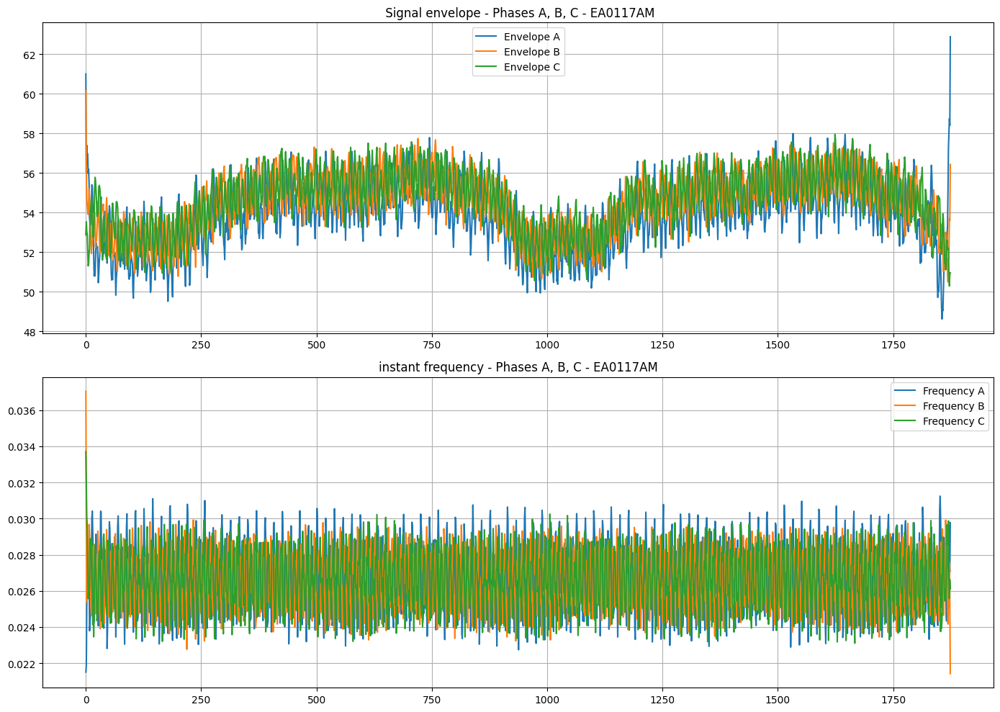

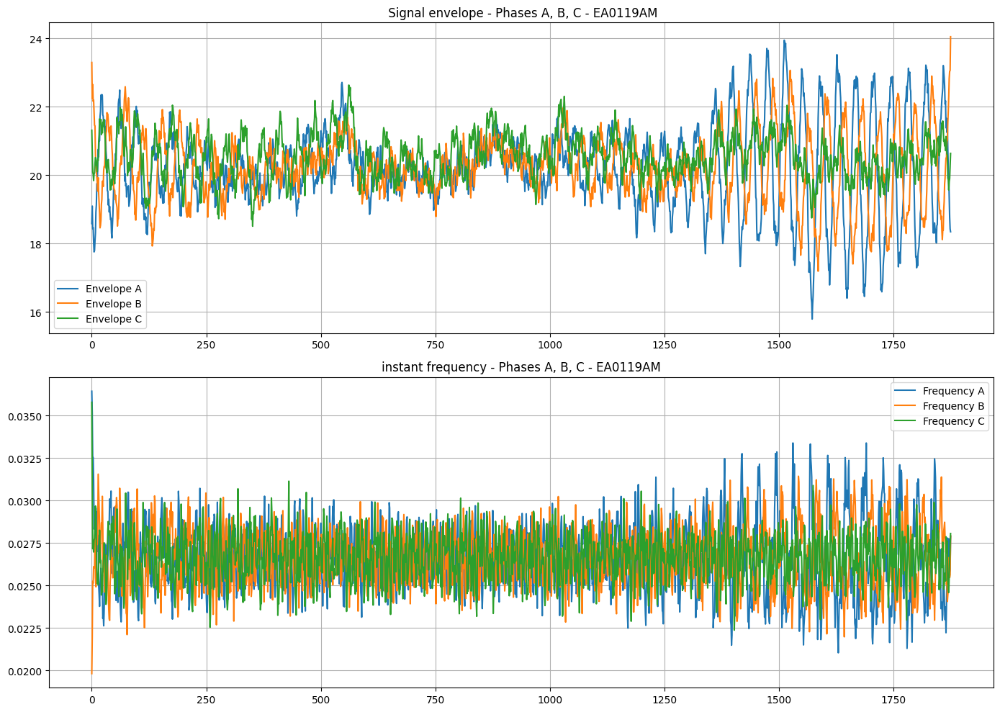

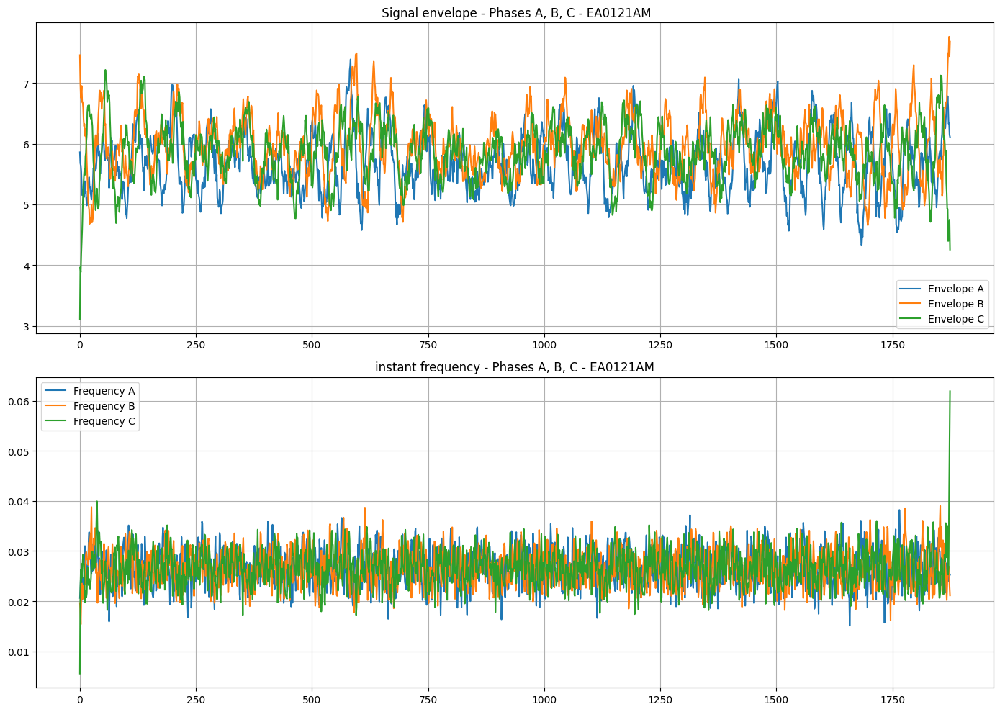

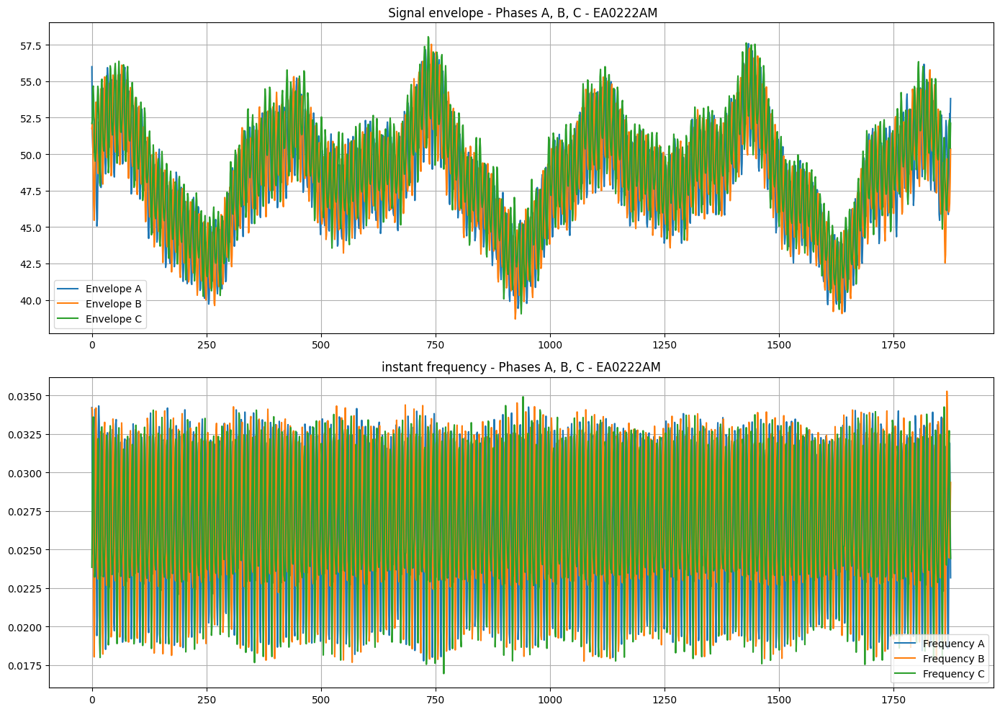

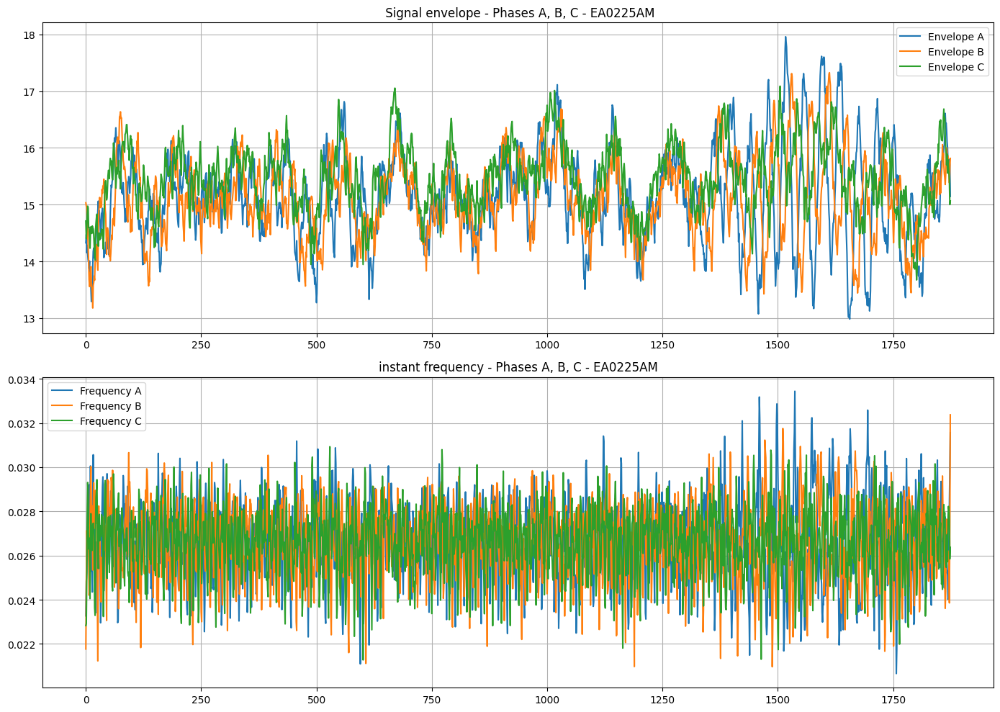

...

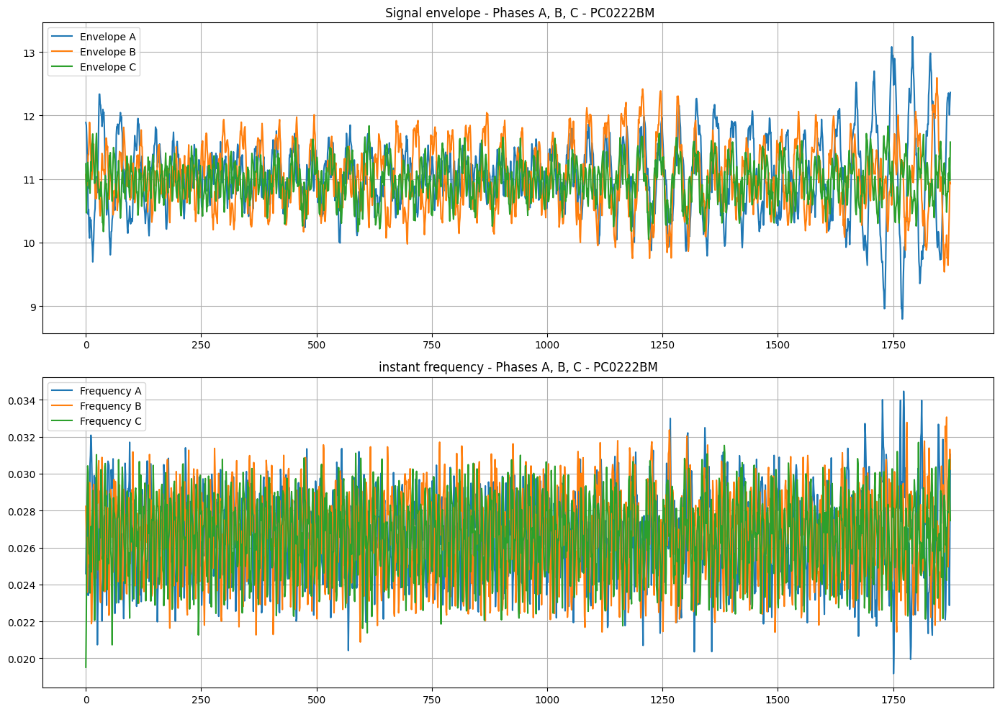

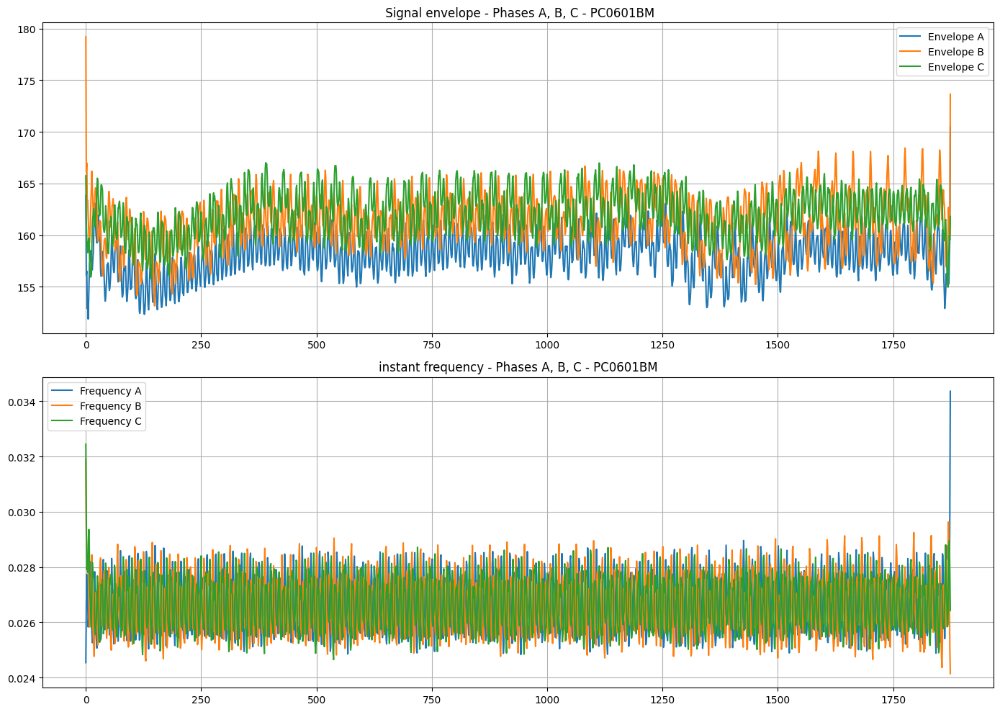

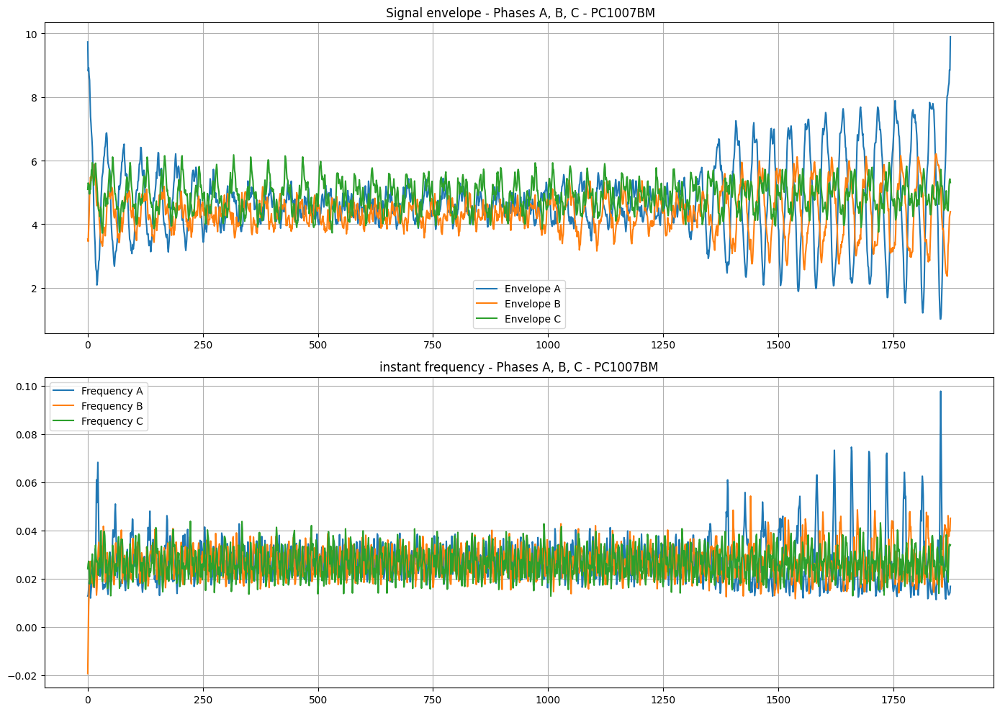

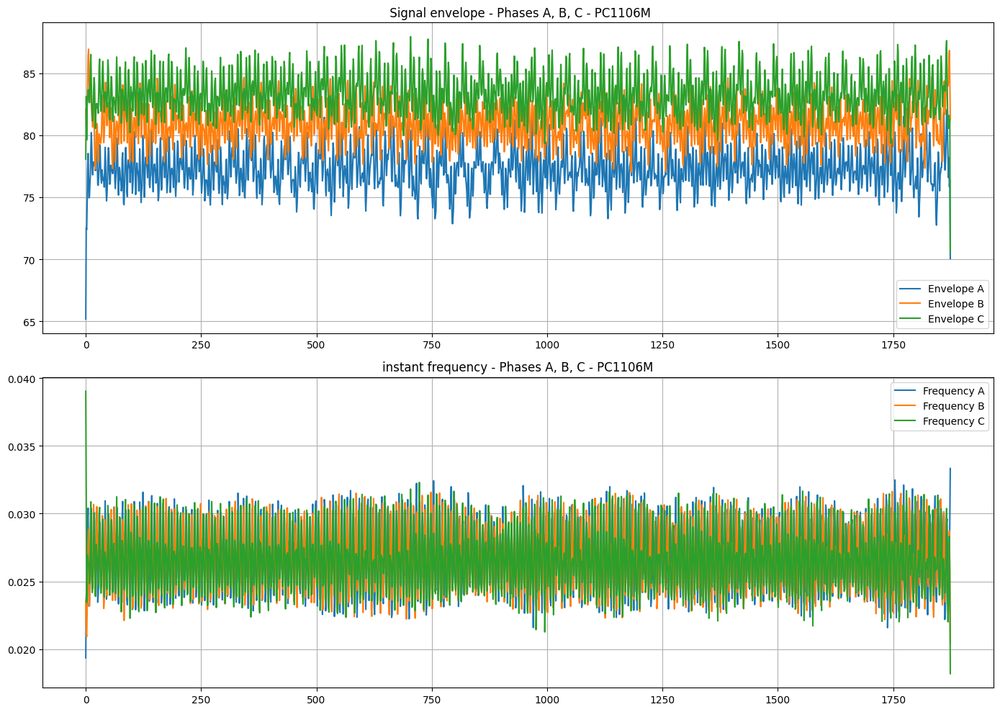

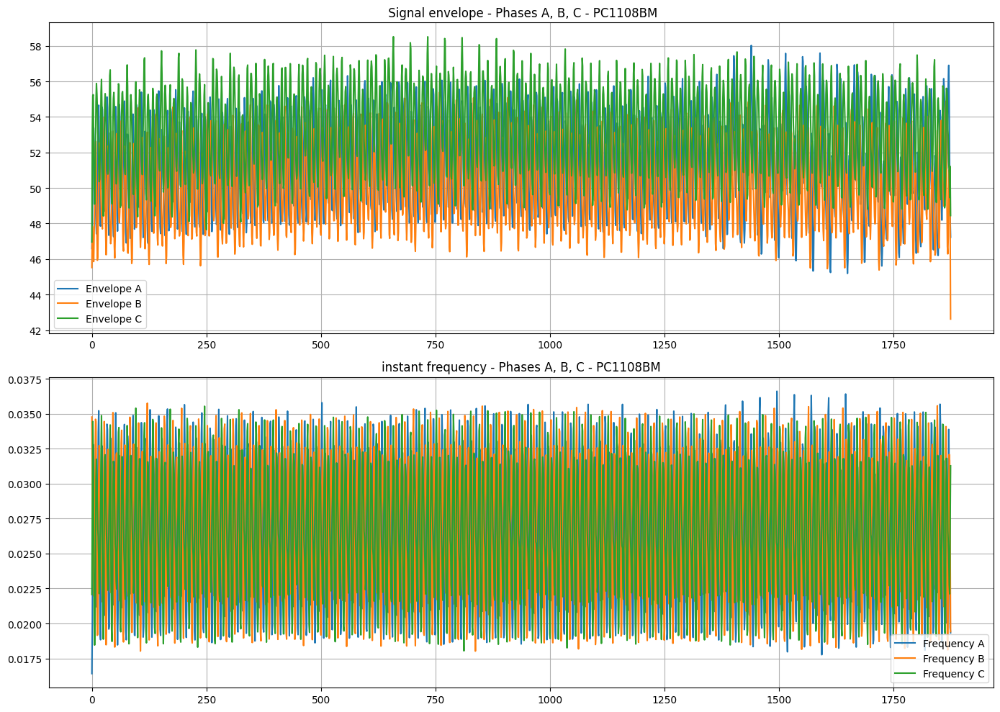

In [ ]:
import pandas as pd
import numpy as np
from scipy.signal import hilbert
import matplotlib.pyplot as plt
import io
from matplotlib.backends.backend_agg import FigureCanvasAgg as FigureCanvas


file_path = "2. MTBE Motors List and Data.xlsx"
motor_names = [ "EA0117AM", "EA0119AM", "EA0121AM", "EA0222AM", "EA0225AM","EA0901AM","EA0901BM","EC1101AM","EC1101BM","EC1101CM",
              "EC1101DM", "KB0701AM", "KC0101AM","PC0101CM","PC0105BM","PC0222BM", "PC0601BM","PC1007BM","PC1106M","PC1108BM"]

#  Hilbert transform function
def hilbert_analysis(signal):
    analytic = hilbert(signal)
    envelope = np.abs(analytic)
    phase = np.unwrap(np.angle(analytic))
    freq = np.gradient(phase) / (2 * np.pi)
    return envelope, freq

# Health Check
def is_healthy(freq, threshold=0.0001):
    return np.std(freq) < threshold

# Processing and generation of graphs for each engine
def process_motor(df, motor_name):
    df['A_avg'] = (df['A(A) Max'] + df['A(A) Min']) / 2
    df['B_avg'] = (df['B(A) Max'] + df['B(A) Min']) / 2
    df['C_avg'] = (df['C(A) Max'] + df['C(A) Min']) / 2

    envelope_A, freq_A = hilbert_analysis(df['A_avg'])
    envelope_B, freq_B = hilbert_analysis(df['B_avg'])
    envelope_C, freq_C = hilbert_analysis(df['C_avg'])

    std_A = np.std(freq_A)
    std_B = np.std(freq_B)
    std_C = np.std(freq_C)

    health_A = is_healthy(freq_A)
    health_B = is_healthy(freq_B)
    health_C = is_healthy(freq_C)

    global_health = "Healthy" if all([health_A, health_B, health_C]) else "Unhealthy"

    health_results = {
        'Phase': ['A', 'B', 'C', 'Global'],
        'Santé': ['Healthy' if health_A else 'Unhealthy',
                  'Healthy' if health_B else 'Unhealthy',
                  'Healthy' if health_C else 'Unhealthy',
                  global_health],
        'Standard deviation frequency': [std_A, std_B, std_C, np.nan]
    }
    health_df = pd.DataFrame(health_results)

    fig, axs = plt.subplots(2, 1, figsize=(14, 10))
    axs[0].plot(envelope_A, label='Envelope A')
    axs[0].plot(envelope_B, label='Envelope B')
    axs[0].plot(envelope_C, label='Envelope C')
    axs[0].set_title(f" Signal envelope - Phases A, B, C - {motor_name}")
    axs[0].legend()
    axs[0].grid(True)

    axs[1].plot(freq_A, label='Frequency A')
    axs[1].plot(freq_B, label='Frequency B')
    axs[1].plot(freq_C, label='Frequency C')
    axs[1].set_title(f"instant frequency - Phases A, B, C - {motor_name}")
    axs[1].legend()
    axs[1].grid(True)

    plt.tight_layout()

    img_stream = io.BytesIO()
    canvas = FigureCanvas(fig)
    canvas.print_png(img_stream)

    return health_df, img_stream

#  Traitement avec gestion des erreurs
output_file_path = "MTBE_Motors_with_health_results.xlsx"
xls = pd.ExcelFile(file_path)
available_sheets = xls.sheet_names

print(" Sheets available in the file :")
print(available_sheets)

all_health_results = []

with pd.ExcelWriter(output_file_path, engine='xlsxwriter') as writer:
    workbook = writer.book

    for motor_name in motor_names:
        print(f"\n Treatment of: {motor_name}")
        if motor_name not in available_sheets:
            print(f" Leaf '{motor_name}' not found. Engine ignored.")
            continue

        try:
            df_motor = pd.read_excel(file_path, sheet_name=motor_name)
            health_df, img_stream = process_motor(df_motor, motor_name)

            health_df.to_excel(writer, sheet_name=motor_name, index=False)

            worksheet = workbook.add_worksheet(f'Graphiques_{motor_name}')
            worksheet.insert_image('A1', 'graph.png', {'image_data': img_stream})

            # Accumulation des résultats globaux
            temp_df = health_df.copy()
            temp_df.insert(0, 'Motor', "")  # Insère une colonne 'Moteur' en première position
            temp_df.loc[temp_df.index[0], 'Motor'] = motor_name  # Écrit le nom du moteur uniquement sur la première ligne
            all_health_results.append(temp_df)


        except Exception as e:
            print(f" Error when processing {motor_name} : {e}")
            continue

    # Résumé global
    if all_health_results:
        final_health_df = pd.concat(all_health_results, ignore_index=True)
        final_health_df.to_excel(writer, sheet_name=' Global results', index=False)
    else:
        print("No valid engines processed, no global results.")

print("\n Processing complete. File generated :", output_file_path)


code pour PDH

Feuilles disponibles : ['Sheet1', 'E30093M', 'E30094M', 'E30095M', 'E30098M', 'E30099M', 'E301011M', 'E301012M', 'E301014M', 'E301022M', 'E301024M', 'P2006BM', 'P4907']

 Treatment of : E30093M

 Treatment of : E30094M

 Treatment of : E30095M

 Treatment of : E30098M

 Treatment of : E30099M

 Treatment of : E301011M

 Treatment of : E301012M

 Treatment of : E301014M

 Treatment of : E301022M

 Treatment of : E301024M

 Treatment of : P2006BM

 Treatment of : P4907

 Generated file : PDH_Motors_with_health_results.xlsx


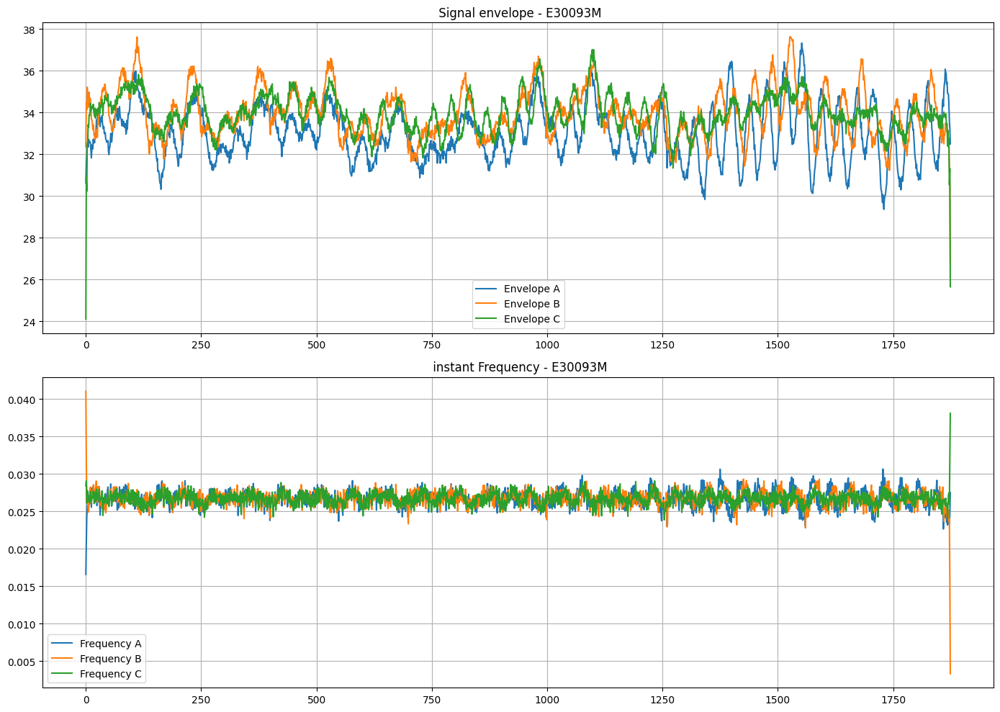

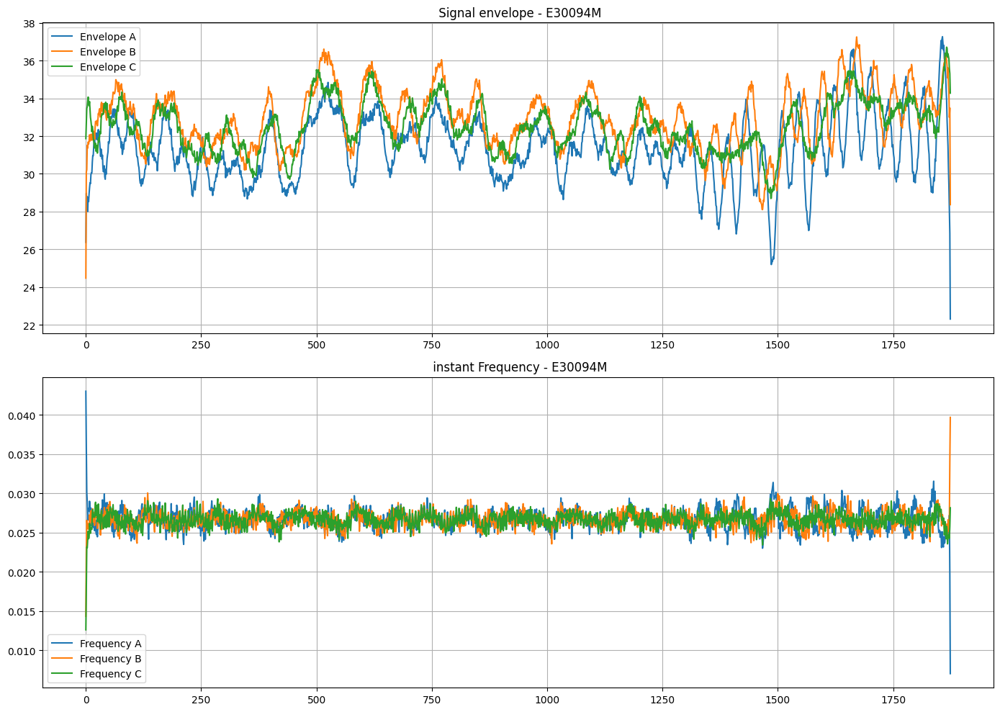

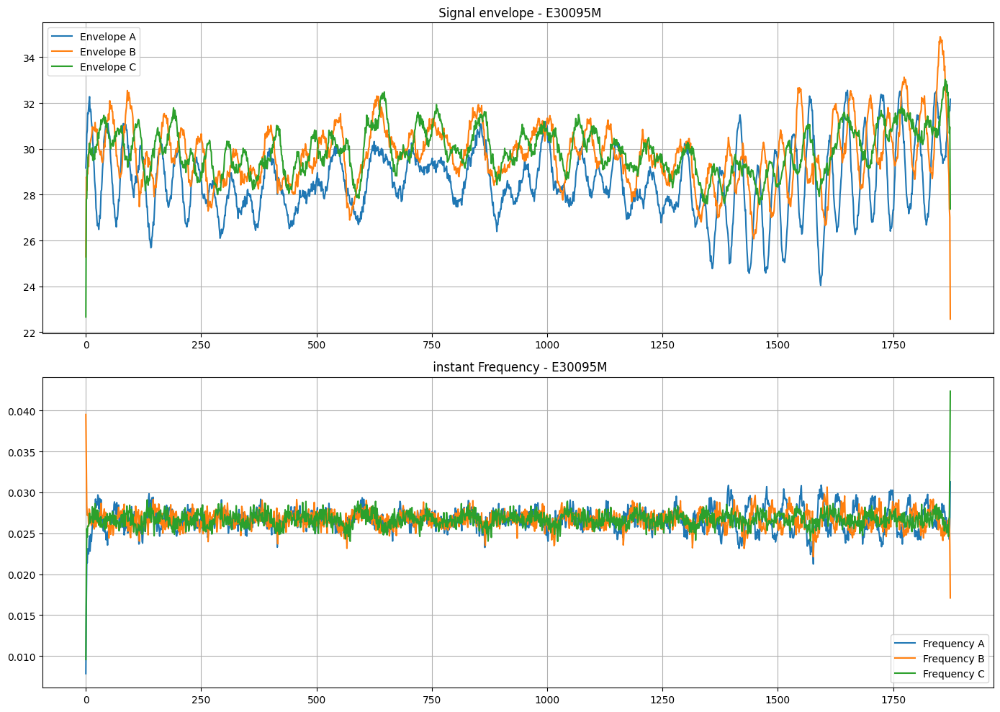

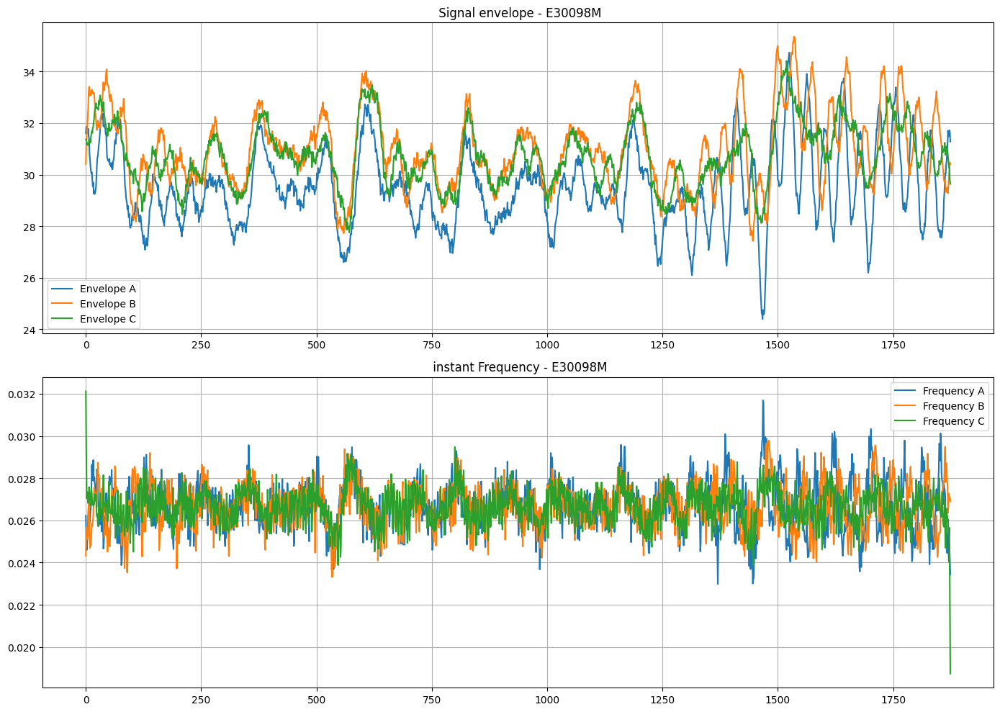

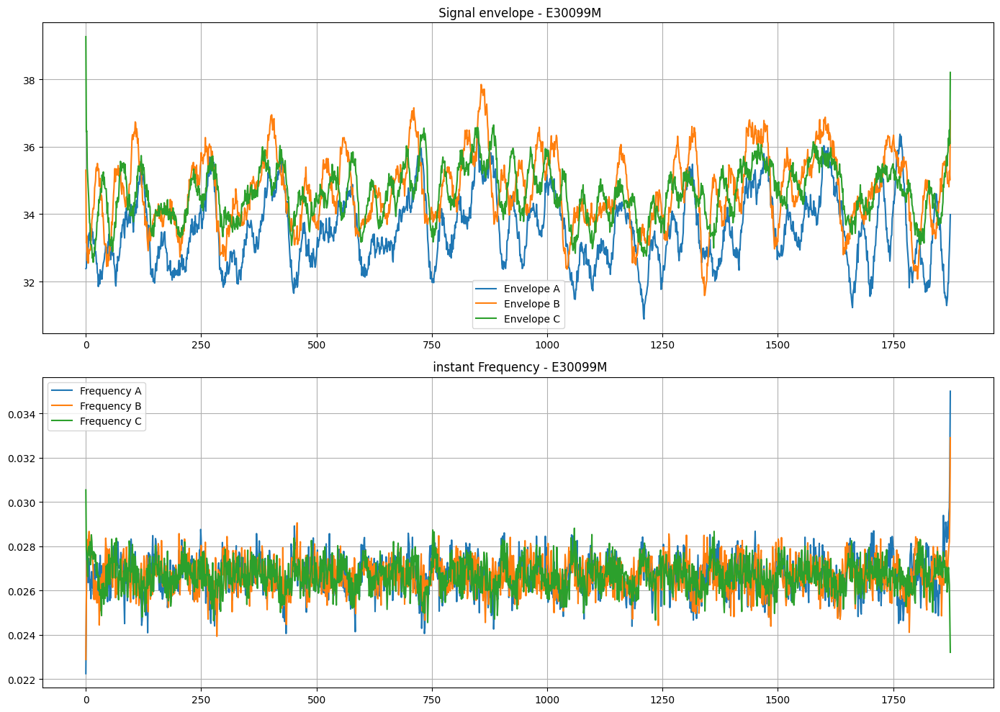

...

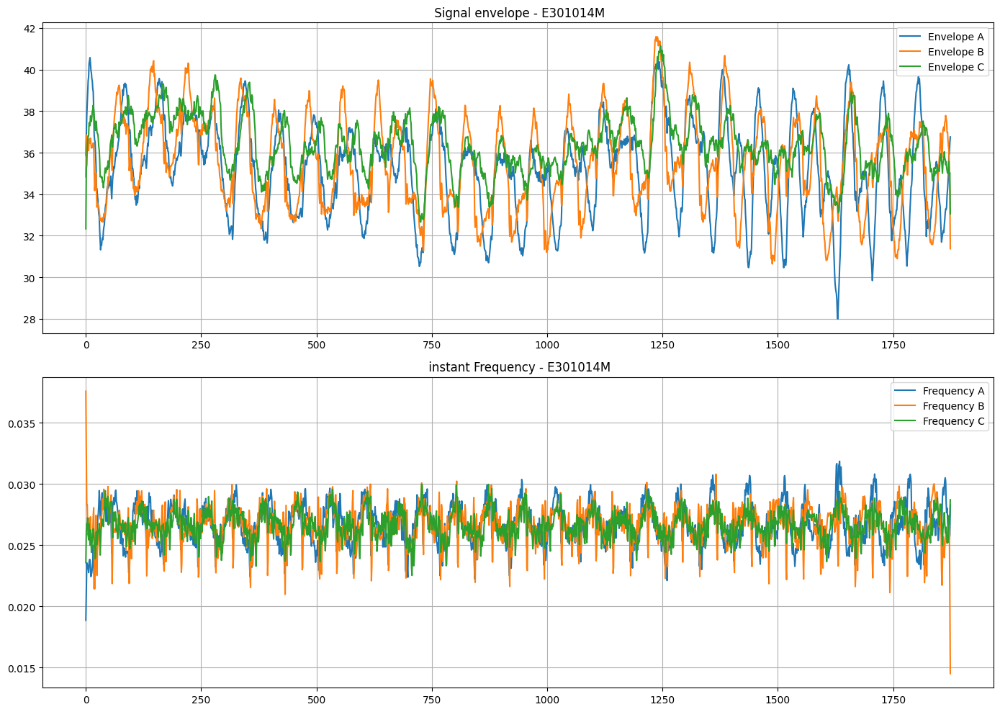

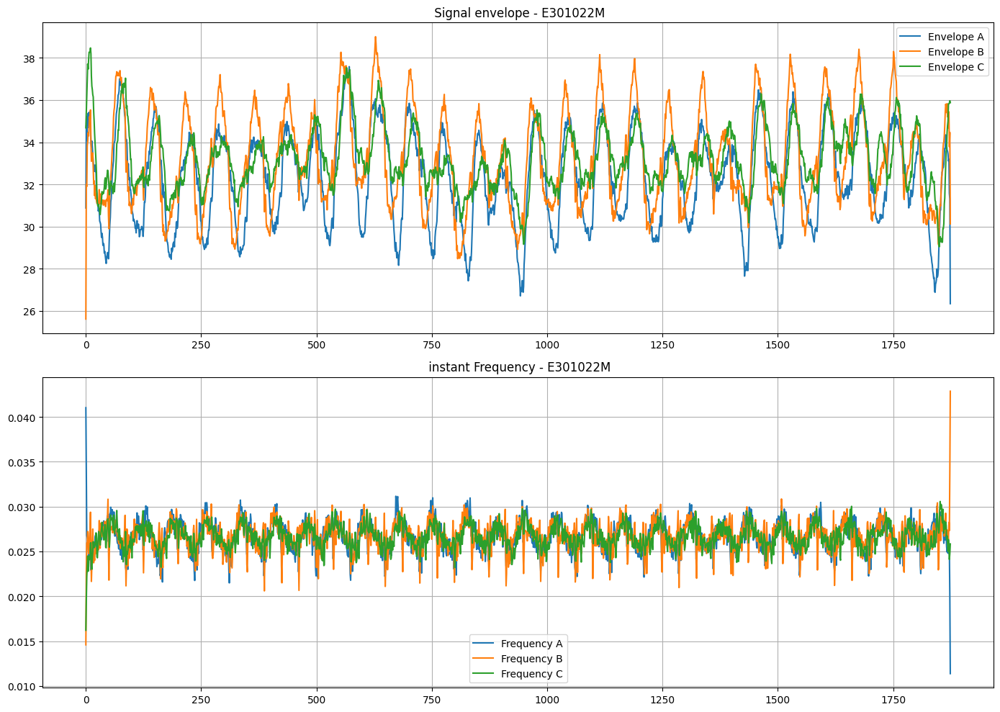

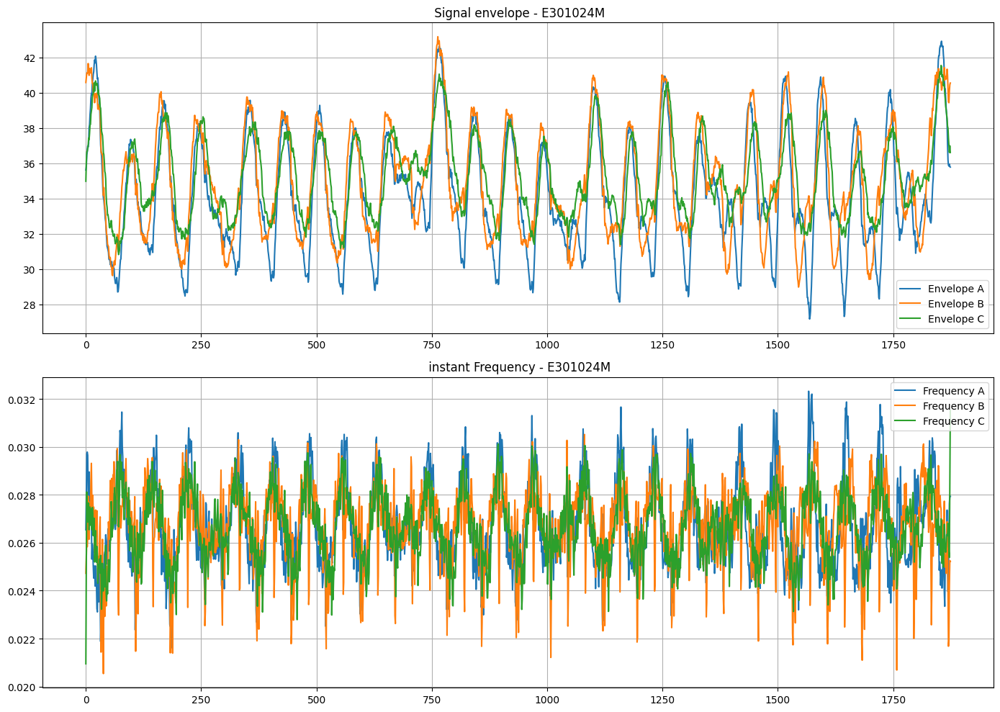

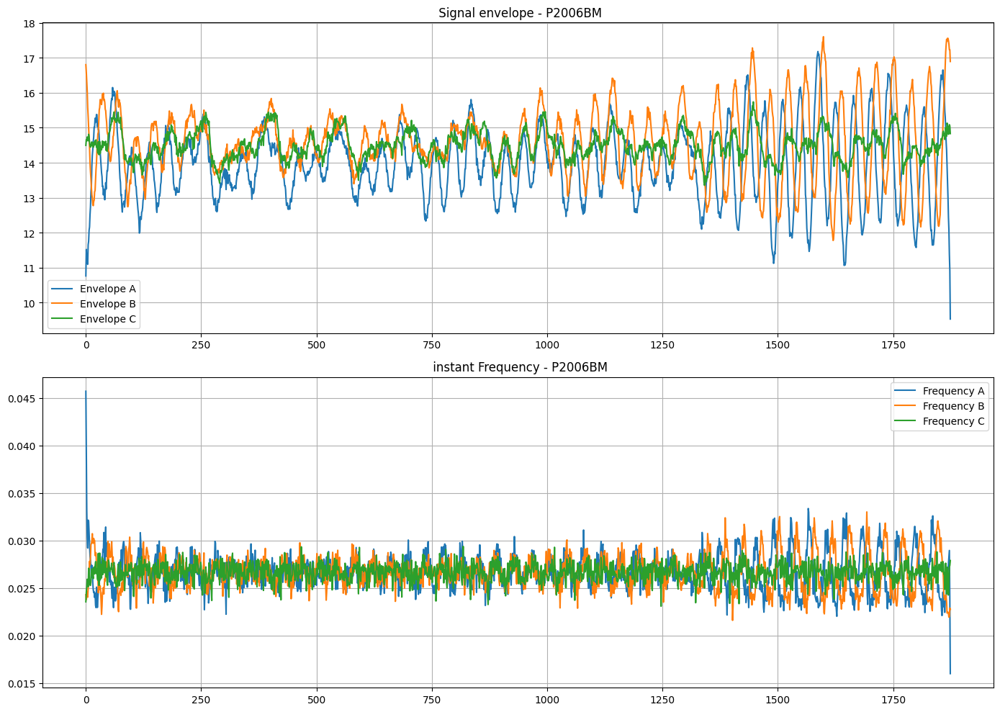

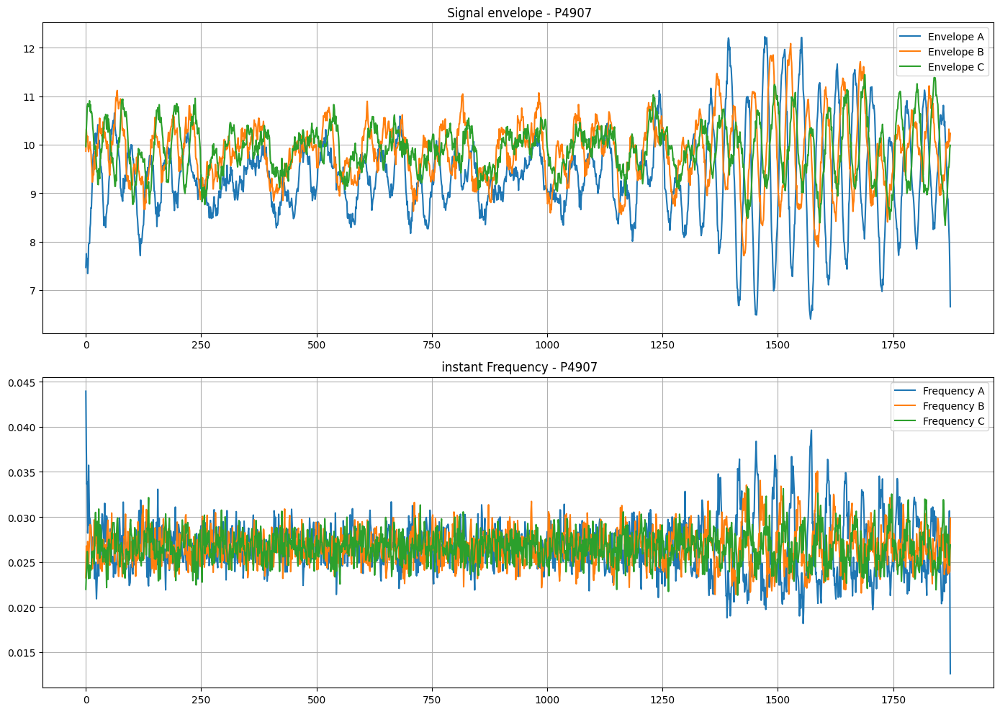

In [ ]:
import pandas as pd
import numpy as np
from scipy.signal import hilbert
import matplotlib.pyplot as plt
import io
from matplotlib.backends.backend_agg import FigureCanvasAgg as FigureCanvas

#  Nettoyage du nom de feuille Excel
def safe_sheet_name(name, max_length=31):
    invalid_chars = ['\\', '/', '*', '?', ':', '[', ']']
    for ch in invalid_chars:
        name = name.replace(ch, '')
    return name[:max_length]

#   Hilbert transform
def hilbert_analysis(signal):
    analytic = hilbert(signal)
    envelope = np.abs(analytic)
    phase = np.unwrap(np.angle(analytic))
    freq = np.gradient(phase) / (2 * np.pi)
    return envelope, freq

#  health check
def is_healthy(freq, threshold=0.0001):
    return np.std(freq) < threshold

#  Engine treatment
def process_motor(df, motor_name):
    df['A_avg'] = (df['A(A) Max'] + df['A(A) Min']) / 2
    df['B_avg'] = (df['B(A) Max'] + df['B(A) Min']) / 2
    df['C_avg'] = (df['C(A) Max'] + df['C(A) Min']) / 2

    envelope_A, freq_A = hilbert_analysis(df['A_avg'])
    envelope_B, freq_B = hilbert_analysis(df['B_avg'])
    envelope_C, freq_C = hilbert_analysis(df['C_avg'])

    std_A = np.std(freq_A)
    std_B = np.std(freq_B)
    std_C = np.std(freq_C)

    health_A = is_healthy(freq_A)
    health_B = is_healthy(freq_B)
    health_C = is_healthy(freq_C)

    global_health = "Healthy" if all([health_A, health_B, health_C]) else "Unhealthy"

    health_results = {
        'Phase': ['A', 'B', 'C', 'Global'],
        'Santé': ['Healthy' if health_A else 'Unhealthy',
                  'Healthy' if health_B else 'Unhealthy',
                  'Healthy' if health_C else 'Unhealthy',
                  global_health],
        'Standard deviation frequency': [std_A, std_B, std_C, np.nan]
    }
    health_df = pd.DataFrame(health_results)

    fig, axs = plt.subplots(2, 1, figsize=(14, 10))
    axs[0].plot(envelope_A, label='Envelope A')
    axs[0].plot(envelope_B, label='Envelope B')
    axs[0].plot(envelope_C, label='Envelope C')
    axs[0].set_title(f" Signal envelope - {motor_name}")
    axs[0].legend()
    axs[0].grid(True)

    axs[1].plot(freq_A, label='Frequency A')
    axs[1].plot(freq_B, label='Frequency B')
    axs[1].plot(freq_C, label='Frequency C')
    axs[1].set_title(f" instant Frequency - {motor_name}")
    axs[1].legend()
    axs[1].grid(True)

    plt.tight_layout()

    img_stream = io.BytesIO()
    canvas = FigureCanvas(fig)
    canvas.print_png(img_stream)
    img_stream.seek(0)

    return health_df, img_stream

#  Main treatment
file_path = "3. PDH Motors List and Data.xlsx"
motor_names = ["E30093M", "E30094M","E30095M", "E30098M", "E30099M", "E301011M","E301012M","E301014M","E301022M","E301024M",
               "P2006BM","P4907"
]
output_file_path = "PDH_Motors_with_health_results.xlsx"

xls = pd.ExcelFile(file_path)
available_sheets = xls.sheet_names
print("Feuilles disponibles :", available_sheets)

all_health_results = []

with pd.ExcelWriter(output_file_path, engine='xlsxwriter') as writer:
    workbook = writer.book
    graph_sheet = workbook.add_worksheet("Graphiques")  # Feuille unique pour tous les graphiques
    writer.sheets["Graphiques"] = graph_sheet

    img_row = 0  # vertical position for images

    for motor_name in motor_names:
        print(f"\n Treatment of : {motor_name}")
        if motor_name not in available_sheets:
            print(f" Leaf '{motor_name}' not found. Ignored.")
            continue

        try:
            df_motor = pd.read_excel(file_path, sheet_name=motor_name)
            health_df, img_stream = process_motor(df_motor, motor_name)

            safe_name = safe_sheet_name(motor_name)
            health_df.to_excel(writer, sheet_name=safe_name, index=False)

            #  Insère les graphiques dans la même feuille, les uns sous les autres
            graph_sheet.insert_image(img_row, 0, f"{motor_name}.png", {'image_data': img_stream})
            graph_sheet.write(img_row, 8, motor_name)  # titre à droite
            img_row += 40  # avance la position pour la prochaine image

            temp_df = health_df.copy()
            temp_df['Moteur'] = motor_name
            all_health_results.append(temp_df)

        except Exception as e:
            print(f" Error for {motor_name} : {e}")
            continue

    if all_health_results:
        final_health_df = pd.concat(all_health_results, ignore_index=True)
        final_health_df.to_excel(writer, sheet_name=' Global results', index=False)

print("\n Generated file :", output_file_path)
